## This notebook basically covers two parts based on the chest X-ray datasets:
* ### Exploratory data analysis
* ### Use transfer learning based on pretrained model to predict tuberculosis

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf
import cv2
from glob import glob
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
image_path = os.path.join("../input/chest-xray-masks-and-labels/data/Lung Segmentation/CXR_png")
mask_path = os.path.join("../input/chest-xray-masks-and-labels/data/Lung Segmentation/masks")
reading_path = os.path.join("../input/chest-xray-masks-and-labels/data/Lung Segmentation/ClinicalReadings")

# Any results you write to the current directory are saved as output.

## Part 1: Exploratory data analysis
### Extract patients information

There are 800 chest x-ray images and 704 masks.

In [2]:
images = os.listdir(image_path)
masks = os.listdir(mask_path)
readings = os.listdir(reading_path)
print('Total number of x-ray images:',len(images))
print('Total number of masks:',len(masks))
print('Total number of clinical readings:',len(readings))

Total number of x-ray images: 800
Total number of masks: 704
Total number of clinical readings: 800


Out of the 800 x-ray images, 394 are tuberculosis positive and 406 are negative.

In [3]:
tb_positive = [image for image in images if image.split('.png')[0][-1]=='1']
tb_negative = [image for image in images if image.split('.png')[0][-1]=='0']
print('There are %d tuberculosis positive cases.' % len(tb_positive))
print('There are %d tuberculosis negative cases.' % len(tb_negative))

There are 394 tuberculosis positive cases.
There are 406 tuberculosis negative cases.


Below shows one TB positive image and one TB negative image. 

Image CHNCXR_0455_1.png is positive on tuberculosis.


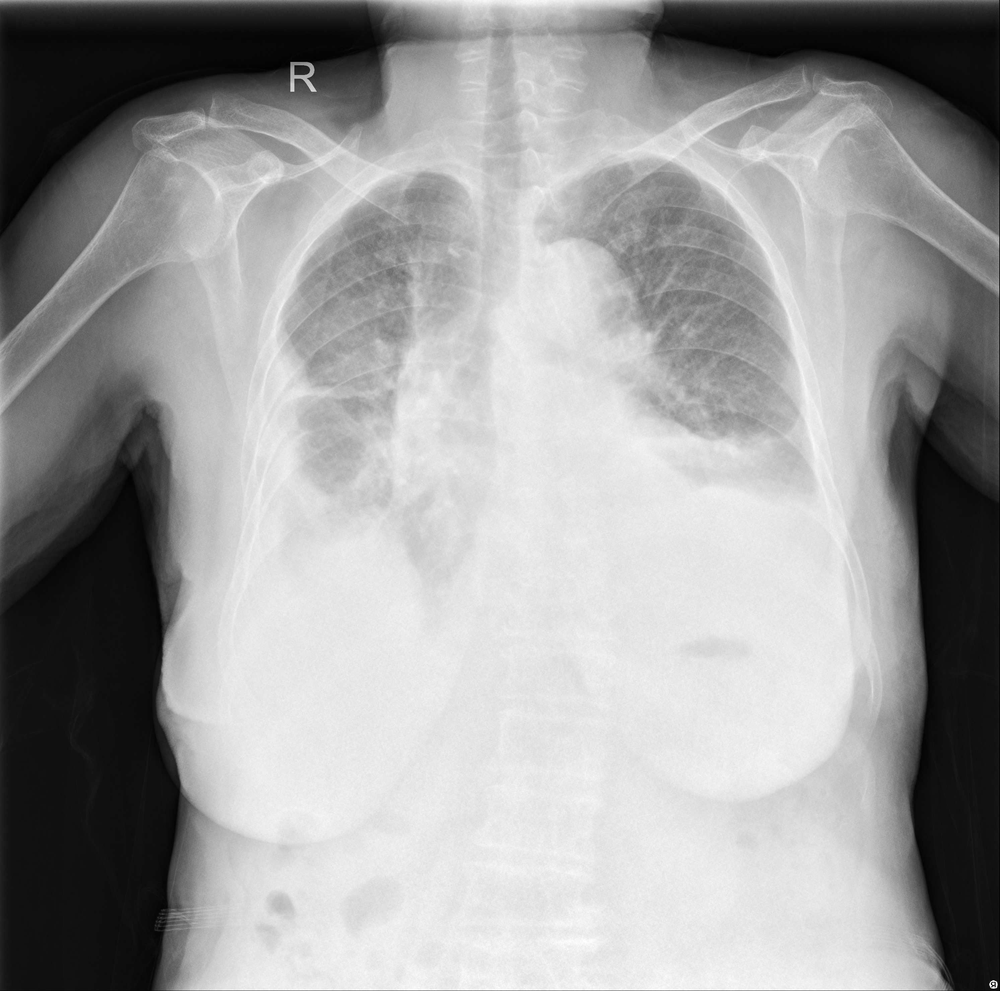

Image CHNCXR_0178_0.png is negative on tuberculosis.


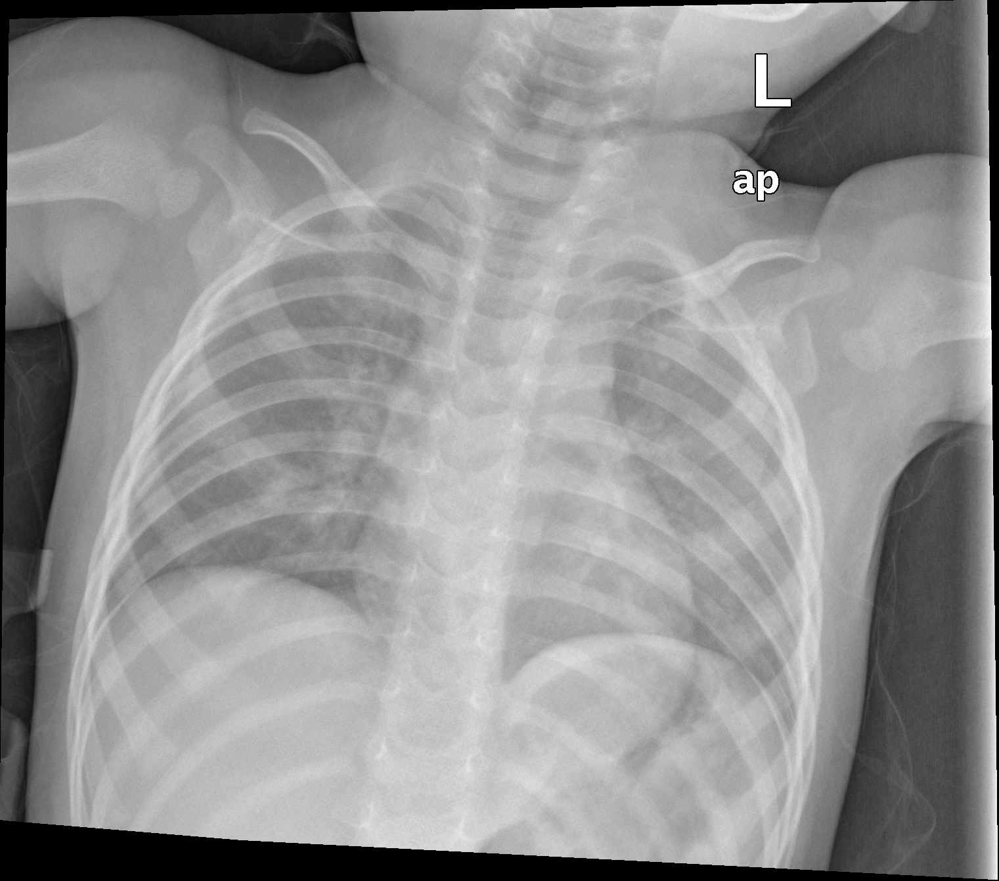

In [4]:
from IPython.display import Image
pos_image = np.random.choice(tb_positive,1)
neg_image = np.random.choice(tb_negative,1)
print("Image %s is positive on tuberculosis." % pos_image[0])
display(Image(os.path.join("../input/chest-xray-masks-and-labels/data/Lung Segmentation/CXR_png",pos_image[0]),width=256,height=256))
print("Image %s is negative on tuberculosis." % neg_image[0])
display(Image(os.path.join("../input/chest-xray-masks-and-labels/data/Lung Segmentation/CXR_png",neg_image[0]),width=256,height=256))

Now we consolidate all patients' information into a dataframe.

In [5]:
tb_state = [int(image.split('.png')[0][-1]) for image in images]
img_df = pd.DataFrame({'Image_name':images, 'TB_state': tb_state})
img_df['Path'] = img_df['Image_name'].map(lambda x: "../input/chest-xray-masks-and-labels/data/Lung Segmentation/CXR_png/"+x)
img_df['Source'] = img_df['Image_name'].map(lambda x: x.split('_')[0])
img_df['Text_path'] = img_df['Image_name'].map(lambda x: "../input/chest-xray-masks-and-labels/data/Lung Segmentation/ClinicalReadings/"+x.split('.png')[0]+'.txt')
img_df.head()

,Image_name,TB_state,Path,Source,Text_path
0,CHNCXR_0151_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...
1,CHNCXR_0515_1.png,1,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...
2,CHNCXR_0024_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...
3,MCUCXR_0070_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,MCUCXR,../input/chest-xray-masks-and-labels/data/Lung...
4,CHNCXR_0575_1.png,1,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...


In [6]:
ages=[]
genders=[]
descriptions=[]
for txt in img_df.Text_path.tolist():
    lines = [line for line in open(txt,'r')]
    if "Patient's Sex:" in lines[0]:
        gender = lines[0][lines[0].index("Patient's Sex:")+len("Patient's Sex:")+1]
        genders.append(gender)
        start = lines[1].index("Patient's Age:")
        length = len("Patient's Age:")
        age = int(lines[1][start+length+2:start+length+4])
        ages.append(age)
        description = ' '.join(lines[2:]).strip()
        descriptions.append(description)
    else:
        if "male" or "MALE" in lines[0]:
            gender = 'M'
            genders.append(gender)
        else:
            gender = 'F'
            genders.append(gender)
        if "yrs" in lines[0]:
            start = lines[0].index("yrs")
            age = int(lines[0][start-2:start])
            ages.append(age)
        elif "yr" in lines[0]:
            start = lines[0].index("yr")
            age = int(lines[0][start-2:start])
            ages.append(age)
        else:
            ages.append(np.NaN)
        description = ' '.join(lines[1:]).strip()
        descriptions.append(description)
            
img_df['Age'] = ages
img_df['Gender'] = genders
img_df['Description'] = descriptions
img_df.head()

,Image_name,TB_state,Path,Source,Text_path,Age,Gender,Description
0,CHNCXR_0151_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,25.0,M,normal
1,CHNCXR_0515_1.png,1,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,23.0,M,PTB in the left upper field
2,CHNCXR_0024_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,22.0,M,normal
3,MCUCXR_0070_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,MCUCXR,../input/chest-xray-masks-and-labels/data/Lung...,45.0,F,normal
4,CHNCXR_0575_1.png,1,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,33.0,M,bilateral PTB


As mentioned earlier, the proportion of TB positive cases is around 50%, out of all the x-ray images.

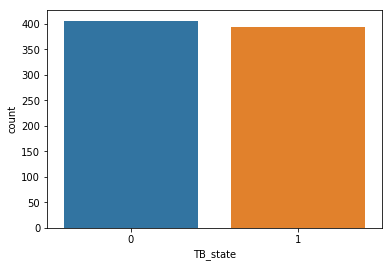

In [7]:
sns.countplot(x='TB_state', data=img_df)

Out of the 800 images, 662 are from Shenzhen and 138 are from Montgomery.

In [8]:
img_df.groupby(by='Source')['Image_name'].count()

Source
CHNCXR    662
MCUCXR    138
Name: Image_name, dtype: int64

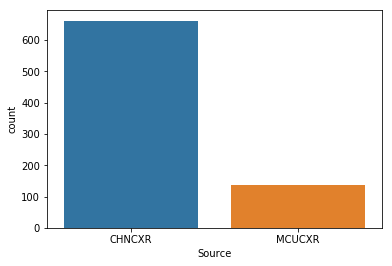

In [9]:
sns.countplot(x='Source', data=img_df)

We have more male patients, and the TB positive rate is also higher for male patients (51.4%) compared with female (28.4%).

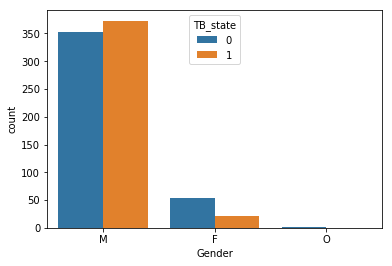

In [10]:
sns.countplot(x='Gender', hue='TB_state', data=img_df)

In [11]:
print('TB positive rate of male patients:',sum((img_df.Gender=='M') & (img_df.TB_state==1)) / sum(img_df.Gender=='M'))

TB positive rate of male patients: 0.5144827586206897


In [12]:
print('TB positive rate of female patients:',sum((img_df.Gender=='F') & (img_df.TB_state==1)) / sum(img_df.Gender=='F'))

TB positive rate of female patients: 0.28378378378378377


We notice there are a few null values in Age column. 

In [13]:
img_df[img_df.Age.isnull()]

,Image_name,TB_state,Path,Source,Text_path,Age,Gender,Description
446,CHNCXR_0201_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,NaN,M,normal
469,CHNCXR_0202_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,NaN,M,normal
535,CHNCXR_0115_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,NaN,M,normal
660,CHNCXR_0018_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,NaN,M,normal


Let's inspect these few records and we find that Age unit is missing.

In [14]:
null_age_imgs = img_df[img_df.Age.isnull()].Text_path
for txt in null_age_imgs:
    lines = [line for line in open(txt,'r')]
    print(lines)

['male 16month\n', 'normal']
['female 64days\n', 'normal']
['male 16month\n', 'normal']
['male 42\n', 'normal']


Next, the missing age information is fixed.

In [15]:
img_df.ix[446,'Age']=1
img_df.ix[469,'Age']=0
img_df.ix[535,'Age']=1
img_df.ix[660,'Age']=42
img_df[img_df.Age.isnull()]

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  This is separate from the ipykernel package so we can avoid doing imports u

,Image_name,TB_state,Path,Source,Text_path,Age,Gender,Description


The age distribution of TB positive patients is shown in the below histogram. Age group from 20 to 40 contributes the highest proportion of TB positive patients.

/opt/conda/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


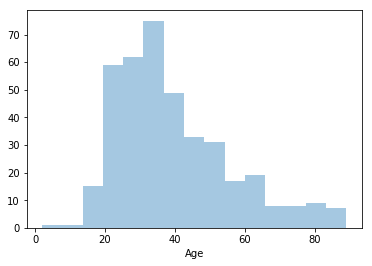

In [16]:
sns.distplot(img_df[img_df.TB_state==1]['Age'], kde=False)

## Part 2: Tuberculosis status prediction

Split data into train, validation and test sets.

In [17]:
from sklearn.model_selection import train_test_split
train_val_ind, test_ind = train_test_split(range(800), test_size=0.15)
train_ind, val_ind = train_test_split(train_val_ind, test_size=0.17647)

print('The length of train set:', len(train_ind))
print('The length of validation set:', len(val_ind))
print('The length of test set:', len(test_ind))

The length of train set: 560
The length of validation set: 120
The length of test set: 120


Recreate directories

In [18]:
# Create a new directory
new_dir = 'new_dir'
os.mkdir(new_dir)

# Create folders inside the new_dir

# train
    # Negative
    # Positive
train_dir = os.path.join(new_dir, 'train_dir')
os.mkdir(train_dir)
Negative = os.path.join(train_dir, 'Negative')
os.mkdir(Negative)
Positive = os.path.join(train_dir, 'Positive')
os.mkdir(Positive)

# val
    # Negative
    # Positive
val_dir = os.path.join(new_dir, 'val_dir')
os.mkdir(val_dir)
Negative = os.path.join(val_dir, 'Negative')
os.mkdir(Negative)
Positive = os.path.join(val_dir, 'Positive')
os.mkdir(Positive)
    
# test
    # Negative
    # Positive
test_dir = os.path.join(new_dir, 'test_dir')
os.mkdir(test_dir)
Negative = os.path.join(test_dir, 'Negative')
os.mkdir(Negative)
Positive = os.path.join(test_dir, 'Positive')
os.mkdir(Positive)

Transfer the images into folders.

In [19]:
img_df.head(2)

,Image_name,TB_state,Path,Source,Text_path,Age,Gender,Description
0,CHNCXR_0151_0.png,0,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,25.0,M,normal
1,CHNCXR_0515_1.png,1,../input/chest-xray-masks-and-labels/data/Lung...,CHNCXR,../input/chest-xray-masks-and-labels/data/Lung...,23.0,M,PTB in the left upper field


In [20]:
['Negative','Positive'][img_df[img_df.Image_name=='CHNCXR_0151_0.png']['TB_state'].tolist()[0]]

'Negative'

In [21]:
train_paths = img_df.ix[train_ind,'Path'].tolist()
val_paths = img_df.ix[val_ind,'Path'].tolist()
test_paths = img_df.ix[test_ind,'Path'].tolist()

for path in train_paths:
    label = ['Negative','Positive'][img_df[img_df.Path==path]['TB_state'].tolist()[0]]
    image_name = img_df[img_df.Path==path]['Image_name'].tolist()[0]
    source = os.path.join(path)
    dest = os.path.join(train_dir, label, image_name)
    
    image = cv2.imread(source)
    image = cv2.resize(image, (512, 512))
    # save the image at the destination
    cv2.imwrite(dest, image)
    #shutil.copyfile(src, dst)

for path in val_paths:
    label = ['Negative','Positive'][img_df[img_df.Path==path]['TB_state'].tolist()[0]]
    image_name = img_df[img_df.Path==path]['Image_name'].tolist()[0]
    source = os.path.join(path)
    dest = os.path.join(val_dir, label, image_name)
    
    image = cv2.imread(source)
    image = cv2.resize(image, (512, 512))
    # save the image at the destination
    cv2.imwrite(dest, image)
    #shutil.copyfile(src, dst)

for path in test_paths:
    label = ['Negative','Positive'][img_df[img_df.Path==path]['TB_state'].tolist()[0]]
    image_name = img_df[img_df.Path==path]['Image_name'].tolist()[0]
    source = os.path.join(path)
    dest = os.path.join(test_dir, label, image_name)
    
    image = cv2.imread(source)
    image = cv2.resize(image, (512, 512))
    # save the image at the destination
    cv2.imwrite(dest, image)
    #shutil.copyfile(src, dst)

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """Entry point for launching an IPython kernel.
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  This is separate from the ipykernel package so we can avoid doing imports u

In [22]:
# check how many train images we have in each folder
print(len(os.listdir('new_dir/train_dir/Negative')))
print(len(os.listdir('new_dir/train_dir/Positive')))

272
288


In [23]:
# check how many val images we have in each folder
print(len(os.listdir('new_dir/val_dir/Negative')))
print(len(os.listdir('new_dir/val_dir/Positive')))

69
51


In [24]:
# check how many test images we have in each folder
print(len(os.listdir('new_dir/test_dir/Negative')))
print(len(os.listdir('new_dir/test_dir/Positive')))

65
55


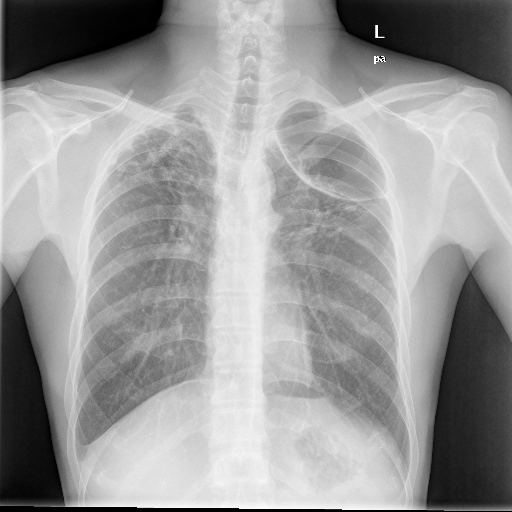

In [25]:
aaa = os.listdir('new_dir/test_dir/Positive')
display(Image(os.path.join("new_dir/test_dir/Positive",aaa[0]),width=256,height=256))

In [26]:
# check how many test images we have in each folder
print(len(os.listdir('new_dir/test_dir/Negative')))
print(len(os.listdir('new_dir/test_dir/Positive')))

65
55


Next, I will try ResNet50, InceptionV3 and InceptionResNetV2.

In [27]:
from tensorflow.python.keras.applications import ResNet50, InceptionV3, InceptionResNetV2
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Dense, Flatten, GlobalAveragePooling2D

#num_classes = 2
resnet_weights_path = '../input/keras-pretrained-models/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'
#inceptionv3_weights_path = '../input/keras-pretrained-models/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'
#inceptionresnetv2_weights_path = '../input/keras-pretrained-models/inception_resnet_v2_weights_tf_dim_ordering_tf_kernels_notop.h5'

my_model = Sequential()
my_model.add(ResNet50(include_top=False, pooling='avg', weights=resnet_weights_path))
#my_model.add(InceptionV3(include_top=False, pooling='avg', weights=inceptionv3_weights_path))
#my_model.add(InceptionResNetV2(include_top=False, pooling='avg', weights=inceptionresnetv2_weights_path))
my_model.add(Dense(2, activation='softmax'))

# Say not to train first layer (ResNet) model. It is already trained
#my_model.layers[0].trainable = False

Instructions for updating:
Colocations handled automatically by placer.


In [28]:
my_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
resnet50 (Model)             (None, 2048)              23587712  
_________________________________________________________________
dense (Dense)                (None, 2)                 4098      
Total params: 23,591,810
Trainable params: 23,538,690
Non-trainable params: 53,120
_________________________________________________________________


Compile model

In [29]:
my_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [30]:
from tensorflow.python.keras.applications.resnet50 import preprocess_input
#from tensorflow.python.keras.applications.inception_v3 import preprocess_input
#from tensorflow.python.keras.applications.inception_resnet_v2 import preprocess_input
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator

image_size = 256

Data augmentation

In [31]:
train_batch_size = 40
val_batch_size = 60

data_generator_with_aug = ImageDataGenerator(preprocessing_function=preprocess_input,
                                   rotation_range=10,
                                   width_shift_range = 0.1,
                                   height_shift_range = 0.1,
                                   zoom_range=0.1)
'''
data_generator_with_aug = ImageDataGenerator(
                                   rotation_range=10,
                                   width_shift_range = 0.1,
                                   height_shift_range = 0.1,
                                   zoom_range=0.1)
'''
train_generator = data_generator_with_aug.flow_from_directory(
        'new_dir/train_dir',
        target_size=(image_size, image_size),
        batch_size=train_batch_size,
        class_mode='categorical')

data_generator_no_aug = ImageDataGenerator(preprocessing_function=preprocess_input)
#data_generator_no_aug = ImageDataGenerator()
validation_generator = data_generator_no_aug.flow_from_directory(
        'new_dir/val_dir',
        target_size=(image_size, image_size),
        batch_size=val_batch_size,
        class_mode='categorical')

Found 560 images belonging to 2 classes.
Found 120 images belonging to 2 classes.


In [32]:
len(train_generator), len(validation_generator)

(14, 2)

Visualize a batch of augmented images

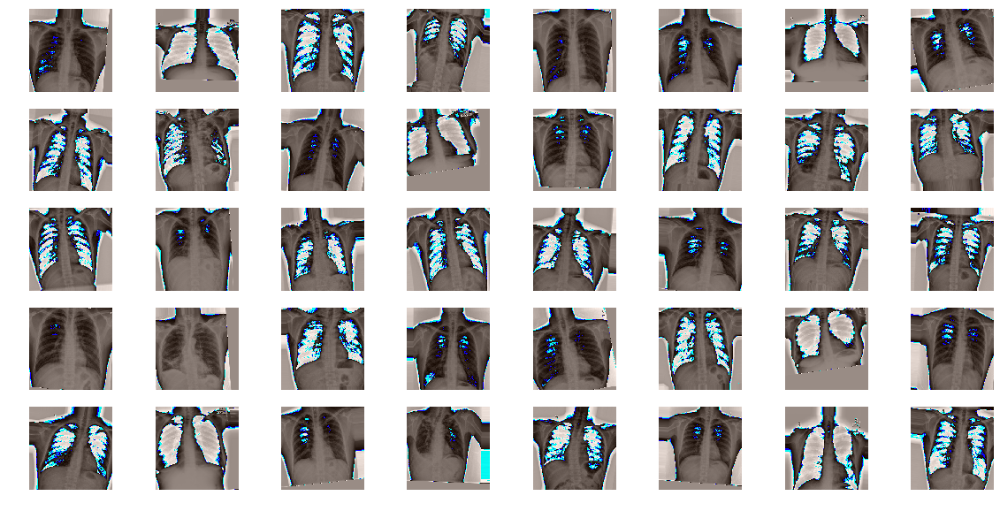

In [33]:
for i in range(len(train_generator)):
    imgs, labels = next(train_generator)
    
# plots images with labels within jupyter notebook
# source: https://github.com/smileservices/keras_utils/blob/master/utils.py

def plots(ims, figsize=(20,10), rows=5, interp=False, titles=None): # 12,6
    if type(ims[0]) is np.ndarray:
        ims = np.array(ims).astype(np.uint8)
        if (ims.shape[-1] != 3):
            ims = ims.transpose((0,2,3,1))
    f = plt.figure(figsize=figsize)
    cols = len(ims)//rows if len(ims) % 2 == 0 else len(ims)//rows + 1
    for i in range(len(ims)):
        sp = f.add_subplot(rows, cols, i+1)
        sp.axis('Off')
        if titles is not None:
            sp.set_title(titles[i], fontsize=16)
        plt.imshow(ims[i], interpolation=None if interp else 'none')
        
plots(imgs, titles=None) # titles=labels will display the image labels

Fit model

In [34]:
import time
start = time.time()

from tensorflow.python.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

filepath = "resnet_1stlayertrained_256_40_60_100.h5"
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, 
                             save_best_only=True, mode='max')

reduce_lr = ReduceLROnPlateau(monitor='val_acc', factor=0.5, patience=2, 
                                   verbose=1, mode='max', min_lr=0.00001)
'''
early = EarlyStopping(monitor="val_loss", 
                      mode="min", 
                      patience=5)
'''
                                                            
callbacks_list = [checkpoint, reduce_lr]

history = my_model.fit_generator(
          train_generator,
          steps_per_epoch=len(train_generator),
          epochs=100,
          validation_data=validation_generator,
          validation_steps=len(validation_generator),
          callbacks=callbacks_list)

print('Running time: %.4f seconds' % (time.time()-start))

Instructions for updating:
Use tf.cast instead.
Epoch 1/100
2/2 [==============================] - 3s 2s/step - loss: 6.8502 - acc: 0.5750

Epoch 00001: val_acc improved from -inf to 0.57500, saving model to resnet_1stlayertrained_256_40_60_100.h5
14/14 [==============================] - 26s 2s/step - loss: 1.1618 - acc: 0.6714 - val_loss: 6.8502 - val_acc: 0.5750
Epoch 2/100
2/2 [==============================] - 2s 796ms/step - loss: 6.8502 - acc: 0.5750

Epoch 00002: val_acc did not improve from 0.57500
14/14 [==============================] - 10s 738ms/step - loss: 0.4813 - acc: 0.7679 - val_loss: 6.8502 - val_acc: 0.5750
Epoch 3/100
2/2 [==============================] - 2s 794ms/step - loss: 9.2679 - acc: 0.4250

Epoch 00003: val_acc did not improve from 0.57500

Epoch 00003: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
14/14 [==============================] - 15s 1s/step - loss: 0.4623 - acc: 0.7964 - val_loss: 9.2679 - val_acc: 0.4250
Epoch 4/100
2/2 [====

Predict test set

In [35]:
test_generator = data_generator_no_aug.flow_from_directory(
        'new_dir/test_dir',
        target_size=(image_size, image_size),
        class_mode='categorical',
        shuffle=False)

Found 120 images belonging to 2 classes.


In [36]:
my_model.load_weights(filepath)

test_loss, test_acc = my_model.evaluate_generator(test_generator)
print('Test loss:', test_loss)
print('Test accuracy:', test_acc)

Test loss: 0.44032005965709686
Test accuracy: 0.85833335


<Figure size 432x288 with 0 Axes>

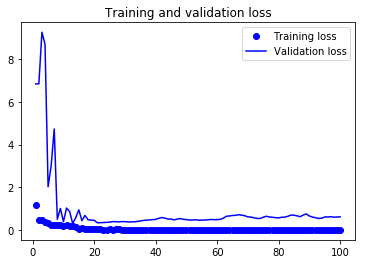

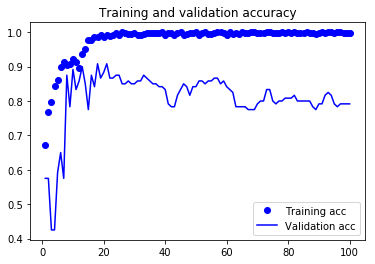

<Figure size 432x288 with 0 Axes>

In [37]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.figure()

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()

Confustion matrix

4/4 [==============================] - 2s 621ms/step


Text(0.5, 1.0, 'Confusion Matrix')

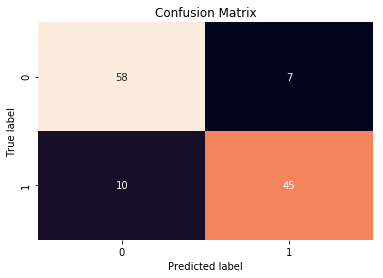

In [38]:
from sklearn.metrics import confusion_matrix
test_labels = test_generator.classes
predictions = my_model.predict_generator(test_generator, verbose=1)
cm = confusion_matrix(test_labels, predictions.argmax(axis=1))
sns.heatmap(cm, annot=True, cbar=False)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

Classification report

In [39]:
from sklearn.metrics import classification_report
print(classification_report(test_labels, predictions.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.85      0.89      0.87        65
           1       0.87      0.82      0.84        55

   micro avg       0.86      0.86      0.86       120
   macro avg       0.86      0.86      0.86       120
weighted avg       0.86      0.86      0.86       120



By default, prediction is classified as positive when the probability of class "Positive" is larger than 0.5. But in medical diagnosis false negative cases should be avoided as much as possible. Therefore, the probability threshold is lowered to mitigate false negative. 

In [40]:
np.mean(test_labels == (predictions[:,1]>0.4))

0.875

Text(0.5, 1.0, 'Confusion Matrix')

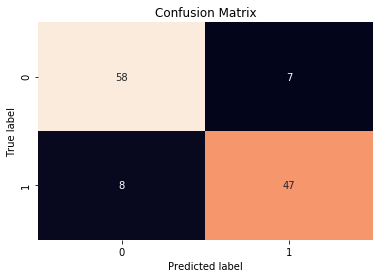

In [41]:
cm = confusion_matrix(test_labels, predictions[:,1]>0.4)
sns.heatmap(cm, annot=True, cbar=False)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')

In [42]:
print(classification_report(test_labels, predictions[:,1]>0.4))

              precision    recall  f1-score   support

           0       0.88      0.89      0.89        65
           1       0.87      0.85      0.86        55

   micro avg       0.88      0.88      0.88       120
   macro avg       0.87      0.87      0.87       120
weighted avg       0.87      0.88      0.87       120



### Delete the image data directory we created to prevent a Kaggle error.
### Kaggle allows a max of 500 files to be saved.

In [43]:
import shutil
shutil.rmtree('new_dir')